## Objective : To extract tables and data within from images

In [5]:
import os
import cv2
from darknet import *
import  numpy as np

In [6]:
# 
net = model_load(cfgPath='cfg/yolov3_full_tables.cfg', wgtPath='cfg/yolov3_full_tables_last_3062.weights')
table_detect =  ObjectDetection(dataPath='cfg/tables.data', netwrk= net)

In [7]:
def get_index(lst, val):
    return lst.index(val)

In [8]:
# using imge processing / mathmatical techniques to correct the borders

def correction_borders(xmin_lst, ymin_lst, xmax_lst, ymax_lst):
    ind = get_index(xmin_lst, min(xmin_lst))
    if cls_lst[ind] == 'borderless' or 'bordered':
        # check y-min and readjust
        if ymin_lst[ind] < 0:
            # find new y-min
            for row in range(img.shape[1]):
                if not np.all(img[row,:,0]==255):
                    #print(row)
                    ymin_lst[ind] = row-2
                    break
    return xmin_lst, ymin_lst, xmax_lst, ymax_lst

In [9]:
# test data
test_data = []
for f in os.listdir('images'):
    if f.endswith('.jpg'):
        temp_name = f.split('.')[0]+'.txt'
        if os.path.isfile('images/'+temp_name):
            pass
        else:
            test_data.append('images/'+f)

In [10]:
print(test_data)

['images/cTDaR_t10027.jpg', 'images/cTDaR_t10103.jpg', 'images/cTDaR_t10104.jpg', 'images/cTDaR_t10105.jpg', 'images/cTDaR_t10106.jpg', 'images/cTDaR_t10107.jpg', 'images/cTDaR_t10108.jpg', 'images/cTDaR_t10109.jpg', 'images/cTDaR_t10110.jpg', 'images/cTDaR_t10263.jpg', 'images/cTDaR_t10309.jpg', 'images/cTDaR_t10310.jpg', 'images/cTDaR_t10349.jpg', 'images/cTDaR_t10350.jpg', 'images/cTDaR_t10351.jpg', 'images/cTDaR_t10352.jpg', 'images/cTDaR_t10353.jpg', 'images/cTDaR_t10354.jpg', 'images/cTDaR_t10355.jpg', 'images/cTDaR_t10356.jpg', 'images/cTDaR_t10357.jpg', 'images/cTDaR_t10358.jpg', 'images/cTDaR_t10359.jpg', 'images/cTDaR_t10360.jpg']


In [15]:
for img_p in test_data:
    print(img_p)
    xmin_lst = []
    xmax_lst = []
    ymin_lst = []
    ymax_lst = []
    cls_lst = []

    img = cv2.imread(img_p)
    res = table_detect.detect(img_p)
    img_ = img.copy()

    if len(res) != 0:
        for ele in res:
            cls, confi, coordi = ele
            xmin,ymin,xmax,ymax = bbox2points(coordi)
            xmin_lst.append(xmin)
            ymin_lst.append(ymin)
            xmax_lst.append(xmax)
            ymax_lst.append(ymax)
            cls_lst.append(cls.decode())
            print(cls, confi, (xmin,ymin), (xmax,ymax))
            img_ = cv2.rectangle(img_, (xmin, ymin), (xmax,ymax),(255, 255, 0), 2)
    #xmin_lst, ymin_lst, xmax_lst, ymax_lst = correction_borders(xmin_lst, ymin_lst, xmax_lst, ymax_lst)
    
    cv2.imwrite('results/'+img_p.split('/')[1], img_)

images/cTDaR_t10027.jpg
b'borderless' 0.9873425960540771 (10, -95) (848, 983)
b'cell' 0.7783628106117249 (649, 138) (677, 151)
b'cell' 0.7492492198944092 (556, 114) (608, 127)
b'cell' 0.744880199432373 (511, 76) (539, 97)
b'cell' 0.7000723481178284 (494, 114) (539, 128)
b'cell' 0.6048721671104431 (576, 143) (607, 158)
b'cell' 0.5902658700942993 (691, 114) (744, 128)
b'cell' 0.5902490615844727 (445, 138) (476, 152)
b'cell' 0.5826932191848755 (617, 73) (679, 106)
b'cell' 0.5255463123321533 (64, 892) (330, 911)
b'cell' 0.5132772922515869 (510, 143) (540, 160)
images/cTDaR_t10103.jpg
b'cell' 0.8400635123252869 (560, 793) (609, 806)
b'cell' 0.8234173059463501 (432, 837) (468, 850)
b'cell' 0.8071571588516235 (487, 859) (538, 871)
b'cell' 0.8057360649108887 (564, 206) (607, 217)
b'cell' 0.7855266332626343 (574, 837) (608, 850)
b'cell' 0.7788506150245667 (631, 792) (678, 804)
b'cell' 0.7753660678863525 (490, 792) (536, 804)
b'cell' 0.7751579284667969 (630, 205) (673, 217)
b'cell' 0.76527404785

images/cTDaR_t10309.jpg
b'cell' 0.9378654360771179 (204, 308) (232, 321)
b'borderless' 0.8656550049781799 (87, 151) (616, 931)
b'cell' 0.8502447605133057 (574, 232) (613, 288)
b'cell' 0.8406065702438354 (663, 733) (692, 747)
b'cell' 0.8308082222938538 (107, 307) (129, 321)
b'cell' 0.8025491833686829 (677, 673) (690, 683)
b'cell' 0.7918962836265564 (678, 689) (690, 700)
b'cell' 0.7610920071601868 (512, 733) (541, 746)
b'cell' 0.7358102202415466 (669, 648) (689, 661)
b'cell' 0.7263732552528381 (518, 648) (540, 662)
b'cell' 0.7218324542045593 (670, 820) (692, 833)
b'cell' 0.6901274919509888 (662, 503) (692, 517)
b'cell' 0.6723781824111938 (669, 339) (691, 352)
b'cell' 0.6605560779571533 (107, 475) (139, 488)
b'cell' 0.6584155559539795 (108, 686) (139, 700)
b'cell' 0.655314028263092 (108, 704) (139, 717)
b'cell' 0.6513239145278931 (108, 602) (138, 616)
b'cell' 0.6490406394004822 (519, 339) (541, 352)
b'cell' 0.6074795126914978 (108, 583) (139, 598)
b'cell' 0.5989874601364136 (526, 672) (53

b'cell' 0.6656387448310852 (468, 654) (668, 730)
b'cell' 0.5251436233520508 (386, 140) (451, 224)
images/cTDaR_t10358.jpg
b'cell' 0.8687079548835754 (266, 241) (288, 256)
b'cell' 0.8530551791191101 (265, 307) (289, 321)
b'cell' 0.840695858001709 (458, 242) (481, 257)
b'cell' 0.7993394732475281 (519, 243) (542, 257)
b'cell' 0.7764971852302551 (267, 369) (288, 383)
b'cell' 0.7647179365158081 (724, 241) (747, 256)
b'cell' 0.7207273840904236 (518, 308) (542, 322)
b'cell' 0.6912797689437866 (268, 391) (289, 405)
b'cell' 0.6433103084564209 (521, 368) (541, 381)
b'cell' 0.6358028650283813 (458, 307) (481, 321)
b'cell' 0.6342102289199829 (337, 239) (356, 254)
b'cell' 0.6330869793891907 (269, 285) (289, 299)
b'cell' 0.570408821105957 (269, 416) (291, 430)
b'cell' 0.524348795413971 (598, 396) (621, 408)
b'cell' 0.522445023059845 (460, 284) (481, 298)
b'cell' 0.5139175653457642 (459, 392) (482, 405)
b'cell' 0.5130828619003296 (523, 389) (542, 402)
b'cell' 0.5072675943374634 (521, 286) (542, 299)


# Report 

    Given the annotated dataset 
    
    1 . I trained a model using YOLOv3, the detailed definition of CNN model can be found in                 darknet.py file. The script xml_txt_parsing converts the xml tree to txt format which is             required by the YOLO model
    
    2. Post this, a model was trained, the current weight while attached has been trained till 3000          iteration and current Training Loass is still 5.xx.
       This Loss Value is still high and might converge if trained further.
    
    3. The model has been tested on a few unseen samples, result of which is attached in the results        folder.
    
    4. I have tried to further increase the accuracy of the detections where we can, so that the            cordinates of bounding box could be optimised to give better performance.

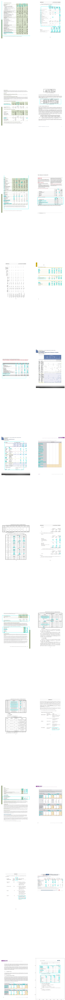

In [25]:
# displaying results 
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize= (30,500))
i=1
for item in os.listdir('results/'):
    #print('results/'+item)
    
    img = cv2.imread('results/'+item)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.axis('off')

    plt.subplot(12, 2, i)
    plt.imshow(img)
    
    i=i+1

plt.show()


## Metric -YOLO

    YOLO uses mAP as a metric ie "MEAN AVERAGE PRECISION"
    mAP is clculated using the IoU which is ratio of Intercestoion Area between Actual or annotated ground truth to the total
    area coverd by union of the Pridicted and annotted box.
    
    Alternatively we can use the confusion matrix to see our True Positive rate.